In [12]:
#!git clone https://github.com/nilearn/nilearn.git

In [13]:
#%cd mnt/lib/python3.7/site-packages/nilearn

In [ ]:
#pip install --user joblib==0.12

In [11]:
#! python setup.py develop --user

In [136]:
%conda create --name conda-env python -y

Solving environment: done

## Package Plan ##

  environment location: /mnt/chrastil/lab/snlbin/programs/mnt/envs/conda-env

  added / updated specs:
    - python


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    certifi-2020.4.5.1         |           py38_0         156 KB
    libffi-3.3                 |       he6710b0_1          50 KB
    ncurses-6.2                |       he6710b0_1         817 KB
    openssl-1.1.1g             |       h7b6447c_0         2.5 MB
    pip-20.0.2                 |           py38_3         1.7 MB
    python-3.8.3               |       hcff3b4d_0        49.1 MB
    setuptools-46.4.0          |           py38_0         515 KB
    sqlite-3.31.1              |       h62c20be_1         1.1 MB
    wheel-0.34.2               |           py38_0          51 KB
    xz-5.2.5                   |       h7b6447c_0         341 KB
    -------------------------------------

In [ ]:
$conda activate conda-env

In [132]:
! conda list -n root


# packages in environment at /mnt/chrastil/lab/snlbin/programs/mnt:
#
# Name                    Version                   Build  Channel
_anaconda_depends         2019.03                  py37_0  
_ipyw_jlab_nb_ext_conf    0.1.0                    py37_0  
_libgcc_mutex             0.1                        main  
alabaster                 0.7.12                   py37_0  
anaconda                  custom                   py37_1  
anaconda-client           1.7.2                    py37_0  
anaconda-navigator        1.9.12                   py37_1  
anaconda-project          0.8.4                      py_0  
argh                      0.26.2                   py37_0  
asn1crypto                1.3.0                    py37_0  
astroid                   2.3.3                    py37_0  
astropy                   4.0              py37h7b6447c_0  
atomicwrites              1.3.0                    py37_1  
attrs                     19.3.0                     py_0  
autopep8               

In [119]:
import sys
sys.path

['/mnt/chrastil/lab/snlbin/programs',
 '/mnt/chrastil/lab/snlbin/programs/mnt/lib/python37.zip',
 '/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7',
 '/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/lib-dynload',
 '',
 '/home/lily/.local/lib/python3.7/site-packages',
 '/mnt/chrastil/lab/snlbin/programs/nistats',
 '/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages',
 '/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/IPython/extensions',
 '/tmp/nethomes/lily-1000085/.ipython']

In [137]:
import nilearn

In [138]:
from nilearn.stats.first_level_model import FirstLevelModel

In [139]:
from nilearn import datasets

In [140]:
##haxby_dataset = datasets.fetch_haxby()

In [141]:
# By default 2nd subject will be fetched
## haxby_dataset = datasets.fetch_haxby()

from bids import BIDSLayout, BIDSValidator

data_dir = '/mnt/chrastil/lab/users/lily/localizer'
layout = BIDSLayout(data_dir, derivatives=True)

In [142]:
import pandas as pd

In [143]:
#TR = 2.5
TR = 0.72

In [75]:
# Load target information as string and give a numerical identifier to each
#behavioral = pd.read_csv(haxby_dataset.session_target[0], sep=' ')
# conditions = behavioral['labels'].values

In [ ]:
#haxby_dataset.session_target

In [76]:
# Record these as an array of sessions
#sessions = behavioral['chunks'].values
#unique_sessions = behavioral['chunks'].unique()

In [77]:
# fMRI data: a unique file for each session
# func_filename = haxby_dataset.func[0]

In [ ]:
##func_filename

In [144]:
import os
import glob
func_filename = glob.glob(os.path.join(data_dir, 'derivatives','fmriprep','*','func','sub-033_task-boldRun*preproc_bold.nii.gz'))
func_filename

['/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun1_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/su

In [145]:
func_filename.pop(6)
func_filename

['/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun1_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz']

In [146]:
func_filename.sort()
func_filename

['/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun1_run-2_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun2_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun3_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun4_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun5_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz',
 '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/func/sub-033_task-boldRun6_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz']

In [ ]:
##behavioral

In [ ]:
##conditions

In [85]:
#############################################################################
# Build a proper event structure for each session
# -----------------------------------------------
# import numpy as np

# events = {}
# #events will take  the form of a dictionary of Dataframes, one per session
# for session in unique_sessions:
#     #get the condition label per session
#     conditions_session = conditions[sessions == session]
#    # get the number of scans per session, then the corresponding
#    # vector of frame times
#     n_scans = len(conditions_session)
#     frame_times = TR * np.arange(n_scans)
#     #each event last the full TR
#     duration = TR * np.ones(n_scans)
#     #Define the events object
#     events_ = pd.DataFrame(
#        {'onset': frame_times, 'trial_type': conditions_session, 'duration': duration})
#    # remove the rest condition and insert into the dictionary
#     events[session] = events_[events_.trial_type != 'rest']

In [ ]:
##events

In [147]:
#event_dir = '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/time/block1'
event_dir = '/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/time/trial1'

In [150]:
import numpy as np

events1 = {}

# events will take  the form of a dictionary of Dataframes, one per session
# for session in range(1,7):
#     print(session)
#     filename = 'sub033_runC' + str(session) + '.txt'
#     filepath = os.path.join(event_dir, filename)
#     events1[session] = pd.read_csv(filepath)
    
for session in range(1,7):
    #print(session)
    for trial in range(1,9):
        #print(trial)
        filename = 'sub033_runC' + str(session) + '_trial'+ str(trial) +'.txt'
        filepath = os.path.join(event_dir, filename)
        events1[(8*(session - 1)+trial)] = pd.read_csv(filepath)

In [151]:
events1

{1:     onset trial_type  duration
 0   0.000          E     1.253
 1   6.879          W     0.400
 2   8.839          N     0.640
 3  11.799          N     0.186
 4  13.612          E     0.173
 5  14.905          E     0.667
 6  17.198          E     0.880
 7  19.704          S     0.214,
 2:      onset trial_type  duration
 0    0.000          W     0.987
 1    2.613          S     0.160
 2    4.400          S     0.226
 3    6.213          E     0.640
 4    8.506          E     0.227
 5   10.359          S     0.173
 6   14.252          S     0.413
 7   17.225          S     0.253
 8   19.038          W     0.187
 9   20.851          W     0.480
 10  23.651          N     0.613,
 3:     onset trial_type  duration
 0   0.000          E     1.307
 1   6.933          W     2.293
 2  10.786          S     0.640
 3  14.612          S     0.413
 4  17.585          S     0.213
 5  19.425          E     0.240,
 4:      onset trial_type  duration
 0    0.000          S     0.800
 1    3.919

In [152]:
# get anat mask file
anat_filename1 = glob.glob(os.path.join(data_dir, 'derivatives','fmriprep','*','anat','sub-033_desc-brain_mask.nii.gz'))
anat_filename2 = glob.glob(os.path.join(data_dir, 'derivatives','fmriprep','*','anat','sub-033_space-MNI152NLin2009cAsym_desc-brain_mask.nii.gz'))


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/reporting/html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



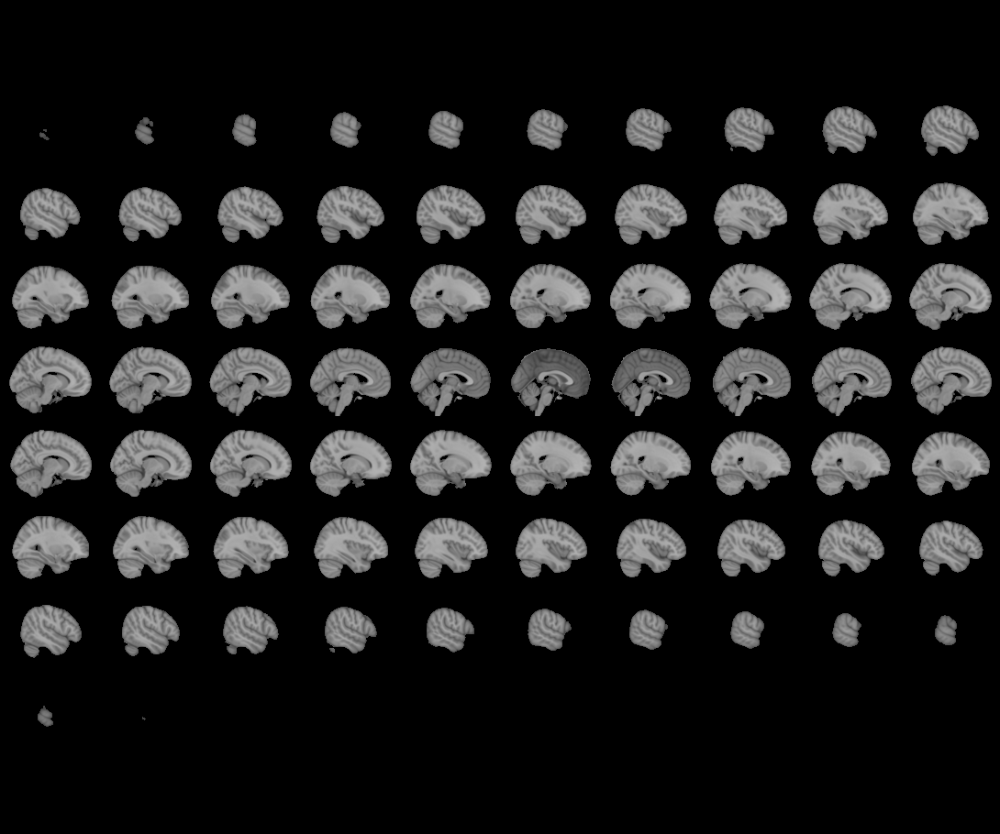
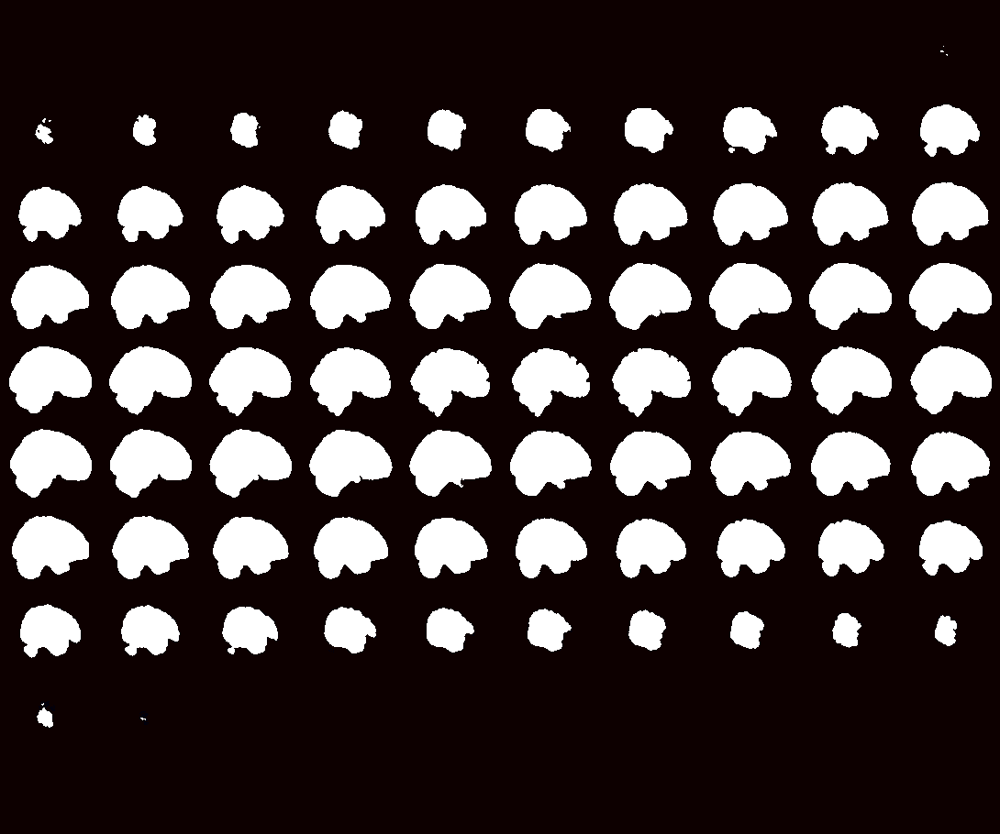

In [153]:
#fmri_test = nib.load(func_filename[0])
from nilearn import plotting
from nilearn.image import mean_img
#plotting.view_img(mean_img(func_filename), threshold=None)
plotting.view_img(mean_img(anat_filename2), threshold=None)

In [154]:
##############################################################################
# Instantiate and run FirstLevelModel
# -----------------------------------
from nilearn.image import index_img
from nilearn.stats import first_level_model

# we are going to generate a list of z-maps together with their session and condition index
z_maps = []
condition_idx = []
session_idx = []

# Instantiate the glm
glm = FirstLevelModel(t_r=TR,
                     mask_img= mean_img(anat_filename2), #haxby_dataset.mask,
                     high_pass=.008,
                     smoothing_fwhm=4,
                     memory='nilearn_cache')

# glm = FirstLevelModel(t_r= TR,
#                       #mask_img = mean_img(anat_filename2),
#                            noise_model='ar1',
#                            standardize=False,
#                            hrf_model='spm + derivative',
#                            drift_model='polynomial',
#                              drift_order=3,
#                      memory='nilearn_cache')
                           #high_pass=.01)


In [87]:
##############################################################################
# Run the glm on data from each session
# -------------------------------------
for session in unique_sessions:
#     grab the fmri data for that particular session
    fmri_session = index_img(func_filename, sessions == session)

    #fit the glm
    glm.fit(fmri_session, events=events[session])

    #set up contrasts: one per condition
    conditions = events[session].trial_type.unique()
    for condition_ in conditions:
       z_maps.append(glm.compute_contrast(condition_))
       condition_idx.append(condition_)
       session_idx.append(session)


________________________________________________________________________________
[Memory] Calling nilearn.image.resampling.resample_img...
resample_img(<nibabel.nifti1.Nifti1Image object at 0x7fa4e80e3810>, target_affine=None, target_shape=None, copy=False, interpolation='nearest')
_____________________________________________________resample_img - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask(<nibabel.nifti1.Nifti1Image object at 0x7fa4e8247c50>, <nibabel.nifti1.Nifti1Image object at 0x7fa4e80e3810>, { 'detrend': False,
  'dtype': None,
  'high_pass': None,
  'low_pass': None,
  'reports': True,
  'sample_mask': None,
  'sessions': None,
  'smoothing_fwhm': 4,
  'standardize': False,
  't_r': 2.5,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(location=nilearn_cache/joblib), verbose=0, confounds=None, copy=True, dtype=None

__________________________________________________________run_glm - 0.8s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 1.733742, ..., -0.444561]), <nibabel.nifti1.Nifti1Image object at 0x7fa4bc05ecd0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.502666, ..., 1.811852]), <nibabel.nifti1.Nifti1Image object at 0x7fa4bc05ecd0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.690828, ...,  0.730153]), <nibabel.nifti1.Nifti1Image object at 0x7fa4bc05ecd0>)
___________________________________________________________unmask - 0.0s, 0.0min
____________

________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.049242, ..., -1.008997]), <nibabel.nifti1.Nifti1Image object at 0x7fa4e8247810>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.336253, ..., -0.596381]), <nibabel.nifti1.Nifti1Image object at 0x7fa4e8247810>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.707037, ..., 1.358865]), <nibabel.nifti1.Nifti1Image object at 0x7fa4e8247810>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Cal

__________________________________________________filter_and_mask - 1.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.stats.first_level_model.first_level_model.run_glm...
run_glm(array([[-15.915996, ...,  22.07737 ],
       ...,
       [-16.981215, ...,   3.372383]], dtype=float32), 
array([[ 0.      , ...,  1.      ],
       ...,
       [-0.259023, ...,  1.      ]]), noise_model='ar1', bins=100, n_jobs=1)
__________________________________________________________run_glm - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.033872, ..., -0.317176]), <nibabel.nifti1.Nifti1Image object at 0x7fa4bcc311d0>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array(

________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([1.583575, ..., 0.488828]), <nibabel.nifti1.Nifti1Image object at 0x7fa4dc2bc710>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([ 0.265741, ..., -0.623721]), <nibabel.nifti1.Nifti1Image object at 0x7fa4dc2bc710>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.20672, ...,  1.09668]), <nibabel.nifti1.Nifti1Image object at 0x7fa4dc2bc710>)
___________________________________________________________unmask - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calli

In [155]:
import nibabel as nib

In [176]:
for session in range(0,6):
    # grab the fmri data for that particular session
    print(session)
    fmri_session = nib.load(func_filename[session])
    
    # build confounds
    
    regressors = 'sub-033_task-boldRun' + str(session+1) + '_run-1_desc-confounds_regressors_new.csv'
    covariatesFile = os.path.join('/mnt/chrastil/lab/users/lily/localizer/derivatives/fmriprep/sub-033/regressor/', regressors)
    confounds = pd.read_csv(covariatesFile)
    
    # replace nans in confounds
    (row_num,col_num) = confounds.shape
    for col in range(0,col_num):
        confounds.iloc[:,col] = confounds.iloc[:,col].replace([np.inf, -np.inf], np.nan)
        confounds.iloc[:,col] = confounds.iloc[:,col].fillna(confounds.iloc[:,col].mean())

    # fit the glm
    #glm.fit(fmri_session, events=events1[session+1], confounds=confounds)
    idx = pd.concat([events1[8*session+1],events1[8*session+2],events1[8*session+3],events1[8*session+4],events1[8*session+5],events1[8*session+6],events1[8*session+7],events1[8*session+8]])
    glm.fit(fmri_session, events=idx, confounds=confounds)
    # set up contrasts: one per condition
    #conditions = events1[session+1].trial_type.unique()
    conditions = idx.trial_type.unique()
    for condition_ in conditions:
        z_maps.append(glm.compute_contrast(condition_))
        condition_idx.append(condition_)
        session_idx.append(session)

0
________________________________________________________________________________
[Memory] Calling nilearn.stats.first_level_model.first_level_model.run_glm...
run_glm(array([[ 5.067814, ..., -2.197674],
       ...,
       [-0.963196, ...,  2.456895]]), 
array([[ 0., ...,  1.],
       ...,
       [-3., ...,  1.]]), noise_model='ar1', bins=100, n_jobs=1)


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/first_level_model/first_level_model.py:513: UserWarning: Persisting input arguments took 14.05s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  bins=100, n_jobs=self.n_jobs)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/model.py:209: RuntimeWarning: invalid value encountered in sqrt
  sd = np.sqrt(self.vcov(matrix=matrix, dispersion=dispersion))
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/_utils/stats.py:298: RuntimeWarning: invalid value encountered in less_equal
  return np.where(X <= 0, 0, 1. / X)


________________________________________________________run_glm - 297.5s, 5.0min


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in greater
  cond1 = (0 < q) & (q < 1)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in less
  cond1 = (0 < q) & (q < 1)


1
________________________________________________________________________________
[Memory] Calling nilearn.stats.first_level_model.first_level_model.run_glm...
run_glm(array([[-2.811986, ...,  8.353689],
       ...,
       [ 0.075659, ...,  0.3652  ]]), 
array([[ 0., ...,  1.],
       ...,
       [-5., ...,  1.]]), noise_model='ar1', bins=100, n_jobs=1)


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/first_level_model/first_level_model.py:513: UserWarning: Persisting input arguments took 12.84s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  bins=100, n_jobs=self.n_jobs)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/model.py:209: RuntimeWarning: invalid value encountered in sqrt
  sd = np.sqrt(self.vcov(matrix=matrix, dispersion=dispersion))
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/_utils/stats.py:298: RuntimeWarning: invalid value encountered in less_equal
  return np.where(X <= 0, 0, 1. / X)


________________________________________________________run_glm - 184.7s, 3.1min


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in greater
  cond1 = (0 < q) & (q < 1)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in less
  cond1 = (0 < q) & (q < 1)


2
________________________________________________________________________________
[Memory] Calling nilearn.stats.first_level_model.first_level_model.run_glm...
run_glm(array([[-2.742373, ...,  6.100036],
       ...,
       [ 0.714384, ...,  0.064326]]), 
array([[ 0., ...,  1.],
       ...,
       [-4., ...,  1.]]), noise_model='ar1', bins=100, n_jobs=1)


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/first_level_model/first_level_model.py:513: UserWarning: Persisting input arguments took 10.44s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  bins=100, n_jobs=self.n_jobs)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/model.py:209: RuntimeWarning: invalid value encountered in sqrt
  sd = np.sqrt(self.vcov(matrix=matrix, dispersion=dispersion))
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/_utils/stats.py:298: RuntimeWarning: invalid value encountered in less_equal
  return np.where(X <= 0, 0, 1. / X)


________________________________________________________run_glm - 169.8s, 2.8min


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in greater
  cond1 = (0 < q) & (q < 1)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in less
  cond1 = (0 < q) & (q < 1)


3
________________________________________________________________________________
[Memory] Calling nilearn.stats.first_level_model.first_level_model.run_glm...
run_glm(array([[-1.798499, ...,  3.165076],
       ...,
       [ 0.601336, ...,  4.458029]]), 
array([[ 0., ...,  1.],
       ...,
       [-4., ...,  1.]]), noise_model='ar1', bins=100, n_jobs=1)


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/first_level_model/first_level_model.py:513: UserWarning: Persisting input arguments took 11.88s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  bins=100, n_jobs=self.n_jobs)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/model.py:209: RuntimeWarning: invalid value encountered in sqrt
  sd = np.sqrt(self.vcov(matrix=matrix, dispersion=dispersion))
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/_utils/stats.py:298: RuntimeWarning: invalid value encountered in less_equal
  return np.where(X <= 0, 0, 1. / X)


________________________________________________________run_glm - 205.5s, 3.4min


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in greater
  cond1 = (0 < q) & (q < 1)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in less
  cond1 = (0 < q) & (q < 1)


4
________________________________________________________________________________
[Memory] Calling nilearn.stats.first_level_model.first_level_model.run_glm...
run_glm(array([[ 3.386524, ...,  0.70946 ],
       ...,
       [-0.848353, ...,  2.67771 ]]), 
array([[ 0., ...,  1.],
       ...,
       [-4., ...,  1.]]), noise_model='ar1', bins=100, n_jobs=1)


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/first_level_model/first_level_model.py:513: UserWarning: Persisting input arguments took 12.08s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  bins=100, n_jobs=self.n_jobs)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/model.py:209: RuntimeWarning: invalid value encountered in sqrt
  sd = np.sqrt(self.vcov(matrix=matrix, dispersion=dispersion))
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/_utils/stats.py:298: RuntimeWarning: invalid value encountered in less_equal
  return np.where(X <= 0, 0, 1. / X)


________________________________________________________run_glm - 245.2s, 4.1min


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in greater
  cond1 = (0 < q) & (q < 1)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:2043: RuntimeWarning: invalid value encountered in less
  cond1 = (0 < q) & (q < 1)


5
________________________________________________________________________________
[Memory] Calling nilearn.stats.first_level_model.first_level_model.run_glm...
run_glm(array([[3.240827, ..., 0.893599],
       ...,
       [1.082335, ..., 6.377398]]), array([[ 0., ...,  1.],
       ...,
       [-5., ...,  1.]]), noise_model='ar1', bins=100, n_jobs=1)


/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/stats/first_level_model/first_level_model.py:513: UserWarning: Persisting input arguments took 12.24s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  bins=100, n_jobs=self.n_jobs)


________________________________________________________run_glm - 273.6s, 4.6min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([0.391117, ..., 0.682981]), <nibabel.nifti1.Nifti1Image object at 0x7fa4dc4f7250>)
___________________________________________________________unmask - 0.7s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.735923, ..., -0.887731]), <nibabel.nifti1.Nifti1Image object at 0x7fa4dc4f7250>)
___________________________________________________________unmask - 0.6s, 0.0min
________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([-0.377928, ..., -0.519885]), <nibabel.nifti1.Nifti1Image object at 0x7fa4dc4f7250>)
___________________________________________________________unmask - 0.5s, 0.0min
____________

In [175]:
pd.concat([events1[8*session+1],events1[8*session+2],events1[8*session+3],events1[8*session+4],events1[8*session+5],events1[8*session+6],events1[8*session+7],events1[8*session+8]])

SyntaxError: invalid syntax (<ipython-input-175-6b622b31e1b1>, line 1)

In [177]:
#########################################################################
# Generating a report
# -------------------
# Since we have already computed the FirstLevelModel
# and have the contrast, we can quickly create a summary report.
from nilearn.image import mean_img
from nilearn.reporting import make_glm_report

mean_img_ = mean_img(func_filename)
report = make_glm_report(glm,
                         contrasts=conditions,
                         bg_img=mean_img_,
                         )

/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/reporting/glm_reporter.py:310: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plot.figure.savefig(buffer, format='svg')
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/reporting/html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))


In [ ]:
#############################################################################
# In a jupyter notebook, the report will be automatically inserted, as above.
# We have several other ways to access the report:

report  # This report can be viewed in a notebook
report.save_as_html('report.html')
report.open_in_browser()


In [110]:
report.save_as_html('report2.html')


In [92]:
pwd

'/mnt/chrastil/.Trash-1000085/files/nilearn'

In [178]:
report

In [179]:
#############################################################################
# Transform the maps to an array of values
# ----------------------------------------
from nilearn.input_data import NiftiMasker

##haxby_dataset = datasets.fetch_haxby()

# no need to standardize or smooth the data
# masker = NiftiMasker(mask_img=haxby_dataset.mask, memory='nilearn_cache',
#                     memory_level=1)
# X = masker.fit_transform(z_maps)

masker = NiftiMasker(mask_img= mean_img(anat_filename2), memory='nilearn_cache',
                     memory_level=1)
X = masker.fit_transform(z_maps)

/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/nilearn/nilearn/input_data/nifti_masker.py:405: UserWarning: Persisting input arguments took 6.16s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  dtype=self.dtype


In [180]:
#############################################################################
# Build the decoder
# ------------------
# Define the prediction function to be used.
# Here we use a Support Vector Classification, with a linear kernel
from sklearn.svm import SVC

svc = SVC(kernel='linear')

# Define the dimension reduction to be used.
# Here we use a classical univariate feature selection based on F-test,
# namely Anova. When doing full-brain analysis, it is better to use
# SelectPercentile, keeping 5% of voxels
# (because it is independent of the resolution of the data).
from sklearn.feature_selection import SelectPercentile, f_classif

feature_selection = SelectPercentile(f_classif, percentile=5)

# We have our classifier (SVC), our feature selection (SelectPercentile),and now,
# we can plug them together in a *pipeline** that performs the two operations
# successively:
from sklearn.pipeline import Pipeline

anova_svc = Pipeline([('anova', feature_selection), ('svc', svc)])

In [181]:
#############################################################################
# Obtain prediction scores via cross validation
# -----------------------------------------------
from sklearn.model_selection import cross_val_score, LeaveOneGroupOut

# Define the cross-validation scheme used for validation.
# Here we use a LeaveOneGroupOut cross-validation on the session group
# which corresponds to a leave-one-session-out
cv = LeaveOneGroupOut()

# Compute the prediction accuracy for the different folds (i.e. session)
cv_scores = cross_val_score(anova_svc, X, condition_idx, cv=cv, groups=session_idx)

# Return the corresponding mean prediction accuracy
classification_accuracy = cv_scores.mean()
chance_level = 1. / len(np.unique(condition_idx))

# Print the results
print('Classification accuracy: {:.4f} / Chance level: {}'.format(
        classification_accuracy, chance_level))
# Classification accuracy:  0.375 / Chance level: 0.125

/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [      0       1       2 ... 1858896 1858897 1858898] are constant.
  UserWarning)
/mnt/chrastil/lab/snlbin/programs/mnt/lib/python3.7/site-packages/sklearn/feature_selection/_univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


Classification accuracy: 0.2500 / Chance level: 0.25
